## EXPLORATORY DATA ANALYSIS ON A DATASET

### Objective:
The main goal of this assignment is to conduct a thorough exploratory analysis of the "cardiographic.csv" dataset to uncover insights, identify patterns, and understand the dataset's underlying structure. You will use statistical summaries, visualizations, and data manipulation techniques to explore the dataset comprehensively.


### Data Cleaning and Preparation:

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 300
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline 

In [22]:
# Load the dataset
df = pd.read_csv(r"https://raw.githubusercontent.com/rohitmaind/ExcelR_Assignments/main/Datasets/Cardiotocographic.csv")

# Display the first few rows of the dataset
df.head()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,73.0,0.5,43.0,2.4,64.0,0.999926,2.0
1,132.000000,0.006380,0.0,0.006380,0.003190,0.0,0.0,17.0,2.1,0.0,10.4,130.0,0.000000,1.0
2,133.000000,0.003322,0.0,0.008306,0.003322,0.0,0.0,16.0,2.1,0.0,13.4,130.0,0.000000,1.0
3,134.000000,0.002561,0.0,0.007742,0.002561,0.0,0.0,16.0,2.4,0.0,23.0,117.0,1.000000,1.0
4,131.948232,0.006515,0.0,0.008143,0.000000,0.0,0.0,16.0,2.4,0.0,19.9,117.0,1.000000,1.0


In [23]:
# Check for missing values
missing_values = df.isnull().sum()
print(missing_values)

# Impute or drop missing values if necessary
df.fillna(df.mean(), inplace=True)  # Imputing with mean values as an example

LB          21
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64


In [24]:
df.describe()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000
mean,133.343598,0.003219,0.009894,0.004391,0.001895,0.000003,0.000175,46.995984,1.364378,10.285964,8.284887,70.429260,0.316371,1.304507
std,11.214328,0.004370,0.067540,0.003340,0.003343,0.000141,0.000836,18.813973,1.173632,21.205041,7.734356,42.719161,0.642424,0.641426
min,51.842487,-0.019284,-0.480634,-0.014925,-0.015393,-0.001353,-0.005348,-63.000000,-6.600000,-91.000000,-50.700000,-174.000000,-3.000000,-1.025988
25%,126.000000,0.000000,0.000000,0.001851,0.000000,0.000000,0.000000,32.000000,0.700000,0.000000,4.600000,37.000000,0.000000,1.000000
50%,133.000000,0.001668,0.000000,0.004484,0.000000,0.000000,0.000000,49.000000,1.200000,0.000000,7.500000,68.000000,0.000000,1.000000
75%,140.000000,0.005606,0.002567,0.006536,0.003289,0.000000,0.000000,61.000000,1.700000,11.000000,10.800000,100.000000,1.000000,1.000000
max,214.000000,0.038567,0.961268,0.030002,0.030769,0.002706,0.010695,162.000000,13.800000,182.000000,101.400000,357.000000,3.000000,5.000000


In [25]:
# Check data types
print(df.dtypes)

# Example of correcting data types (replace 'column_name' with actual column names)
df['LB'] = df['LB'].astype(float)  # Example: converting 'LB' to float if necessary


LB          float64
AC          float64
FM          float64
UC          float64
DL          float64
DS          float64
DP          float64
ASTV        float64
MSTV        float64
ALTV        float64
MLTV        float64
Width       float64
Tendency    float64
NSP         float64
dtype: object


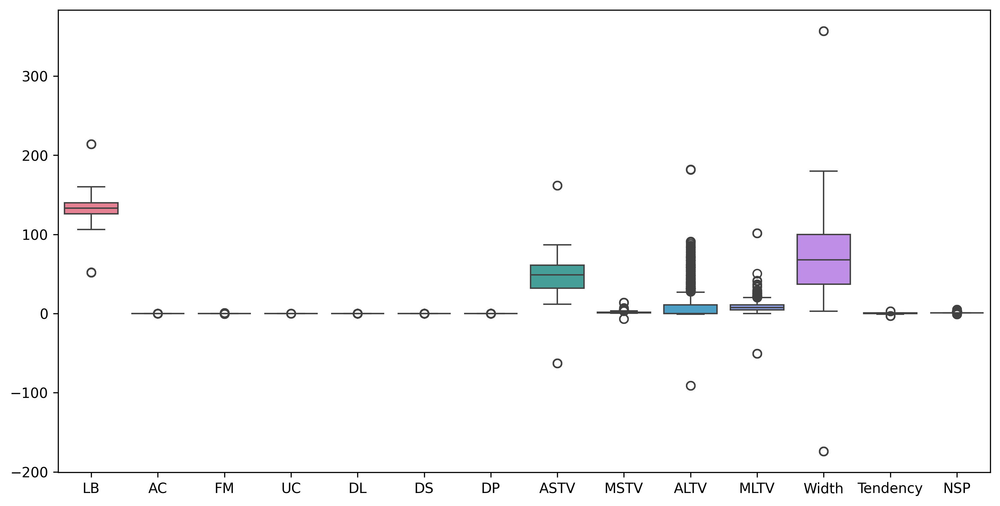

In [26]:
# Boxplot to detect outliers
plt.figure(figsize=(12, 6))
sns.boxplot(data=df)
plt.show()

# Removing outliers using IQR method
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
df = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]


In [27]:
# Statistical summary
summary = df.describe()
print(summary)

# Additional summary statistics
median = df.median()
iqr = df.quantile(0.75) - df.quantile(0.25)


               LB          AC          FM          UC          DL     DS  \
count  883.000000  883.000000  883.000000  883.000000  883.000000  883.0   
mean   131.842621    0.004071    0.000603    0.004952    0.001545    0.0   
std      9.461012    0.003726    0.001337    0.002718    0.002218    0.0   
min    106.000000   -0.000122   -0.002467   -0.000101   -0.000124    0.0   
25%    125.000000    0.000000    0.000000    0.003098    0.000000    0.0   
50%    133.000000    0.003350    0.000000    0.005051    0.000000    0.0   
75%    138.000000    0.006719    0.000336    0.006927    0.003084    0.0   
max    160.000000    0.013861    0.006272    0.012072    0.008197    0.0   

          DP        ASTV        MSTV        ALTV        MLTV       Width  \
count  883.0  883.000000  883.000000  883.000000  883.000000  883.000000   
mean     0.0   42.401260    1.271275    3.170071    8.613856   67.795732   
std      0.0   15.079872    0.538496    6.036208    4.487502   32.607863   
min      0.

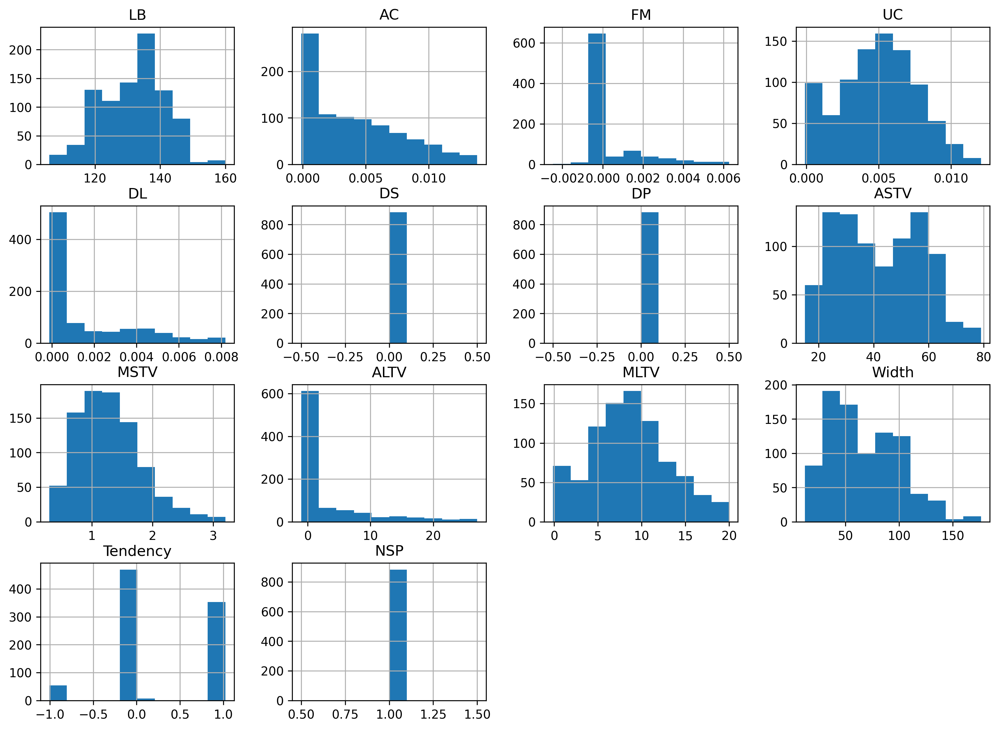

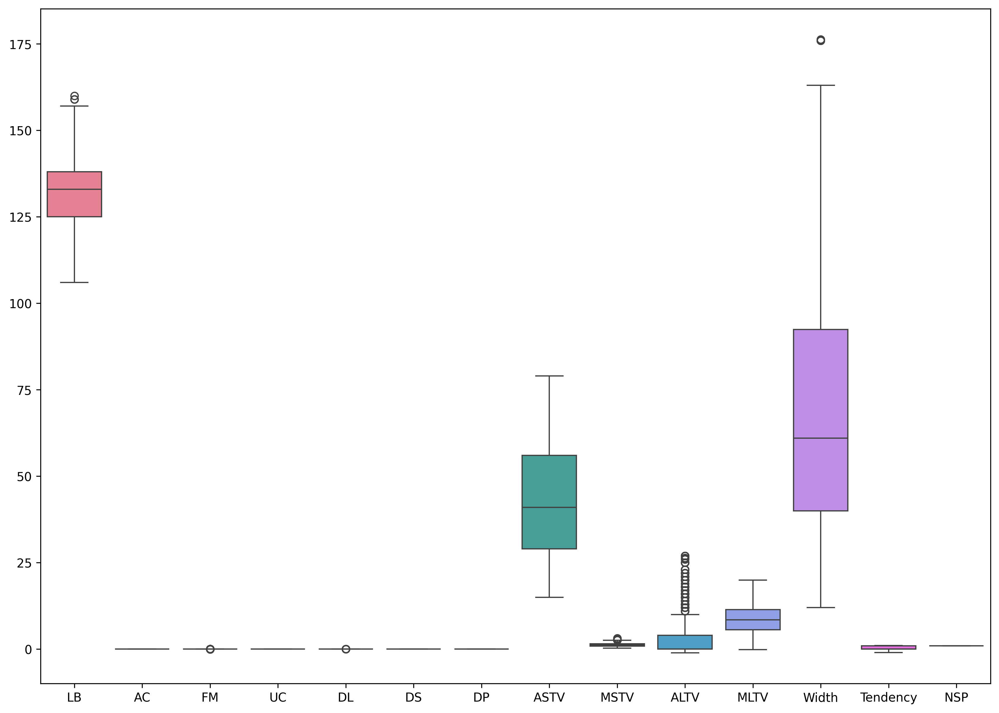

In [28]:
# Histograms
df.hist(figsize=(14, 10))
plt.show()

# Boxplots
plt.figure(figsize=(14, 10))
sns.boxplot(data=df)
plt.show()


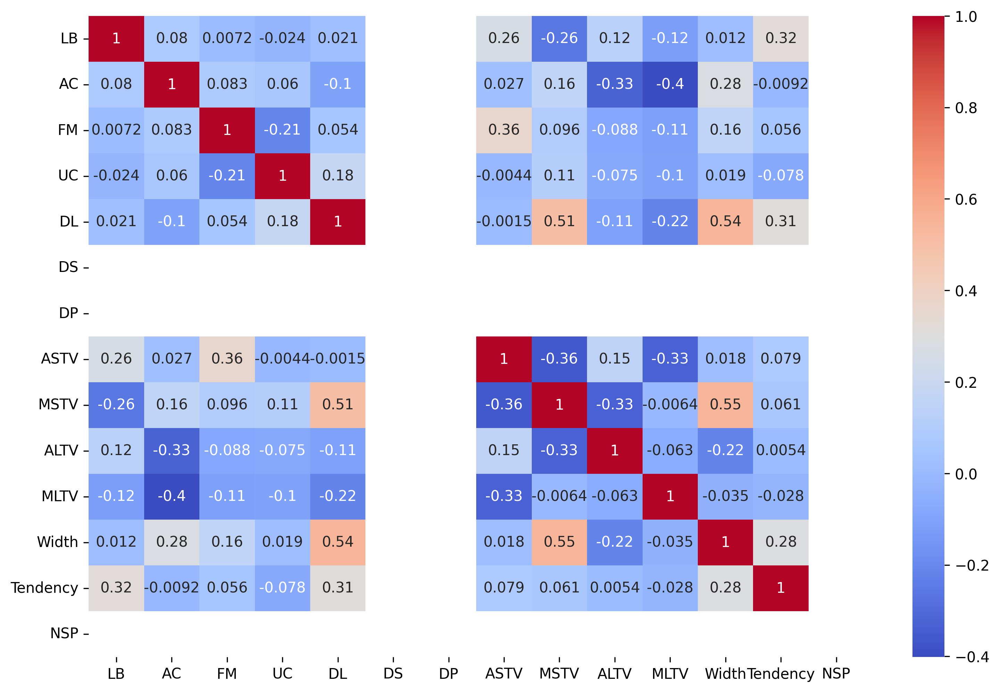

In [29]:
# Scatter plots
sns.pairplot(df)
plt.show()

# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.show()


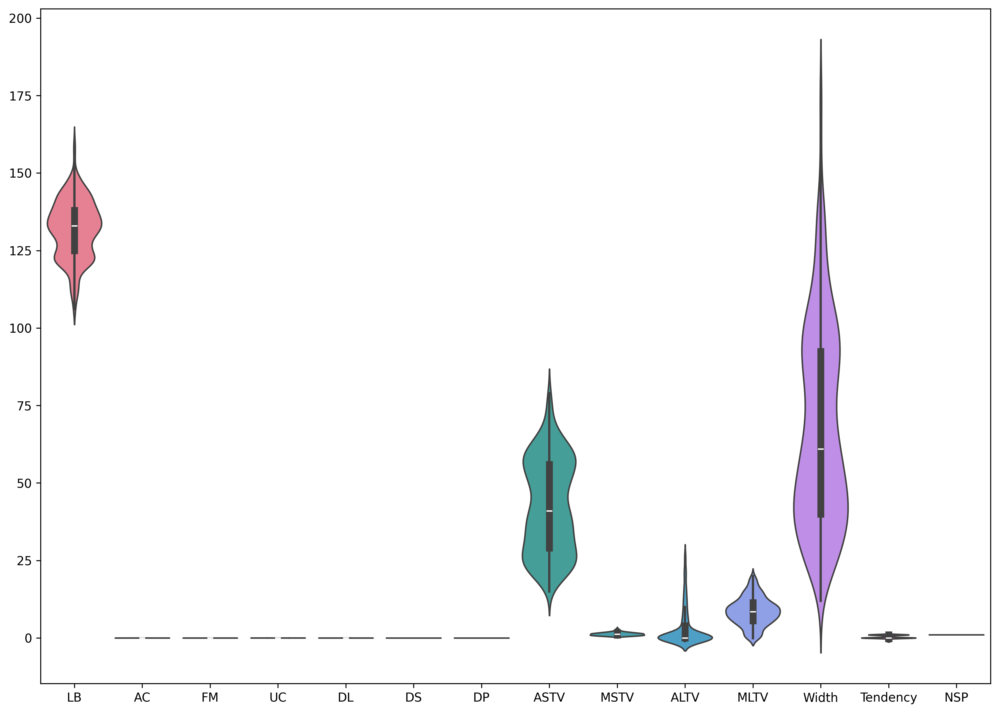

In [30]:
# Pair plot
sns.pairplot(df)
plt.show()

# Violin plot example
plt.figure(figsize=(14, 10))
sns.violinplot(data=df)
plt.show()


In [31]:
# Correlation matrix
correlation_matrix = df.corr()
print(correlation_matrix)

# Insights from correlations
# Example: If LB and AC are highly correlated, discuss implications

                LB        AC        FM        UC        DL  DS  DP      ASTV  \
LB        1.000000  0.079880  0.007221 -0.024043  0.020850 NaN NaN  0.263728   
AC        0.079880  1.000000  0.082838  0.059763 -0.102355 NaN NaN  0.027355   
FM        0.007221  0.082838  1.000000 -0.210594  0.054073 NaN NaN  0.362223   
UC       -0.024043  0.059763 -0.210594  1.000000  0.179120 NaN NaN -0.004439   
DL        0.020850 -0.102355  0.054073  0.179120  1.000000 NaN NaN -0.001525   
DS             NaN       NaN       NaN       NaN       NaN NaN NaN       NaN   
DP             NaN       NaN       NaN       NaN       NaN NaN NaN       NaN   
ASTV      0.263728  0.027355  0.362223 -0.004439 -0.001525 NaN NaN  1.000000   
MSTV     -0.258983  0.157814  0.095904  0.108714  0.506833 NaN NaN -0.357606   
ALTV      0.124994 -0.328318 -0.087823 -0.074660 -0.106325 NaN NaN  0.146468   
MLTV     -0.118409 -0.401056 -0.111782 -0.103585 -0.215279 NaN NaN -0.331045   
Width     0.011791  0.282449  0.162211  

## Conclusion
### Key Insights
1. Summary of statistical measures: Provide insights from the statistical summary.
2. Distribution patterns: Highlight any interesting patterns from histograms and boxplots.
3. Correlation insights: Discuss significant correlations and their potential implications.
4. Trends and patterns: Summarize any temporal trends or patterns identified.
